In [1]:
#Importing Libraries 
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import geopandas as gpd
import math
from sklearn.ensemble import GradientBoostingRegressor

In [2]:
#Importing dataset
gdp_growth = pd.read_csv(r"C:\Users\btdjf\Desktop\Ironhack 2\Final Bootcamp Project\Final-Bootcamp-Project\Datasets\gdp_growth.csv", encoding='ISO-8859-1')
gdp_growth

,country_name,indicator_name,1980,1981,1982,1983,1984,1985,1986,1987,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.2,2.6,1.2,3.9,-2.4,-20.7,NaN,NaN,NaN
1,Albania,Annual GDP growth (percent change),2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,...,2.2,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3
2,Algeria,Annual GDP growth (percent change),-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1
3,Andorra,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5
4,Angola,Annual GDP growth (percent change),2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Vietnam,Annual GDP growth (percent change),-3.5,5.8,8.2,7.1,8.4,5.6,3.4,2.5,...,7.0,6.7,6.9,7.5,7.4,2.9,2.6,8.0,4.7,5.8
192,West Bank and Gaza,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.7,8.9,1.4,1.2,1.4,-11.3,7.0,3.9,3.0,2.7
193,Yemen,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-28.0,-9.4,-5.1,0.8,2.1,-8.5,-1.0,1.5,-0.5,2.0
194,Zambia,Annual GDP growth (percent change),3.9,6.6,-2.9,-1.1,-1.7,1.2,1.7,1.5,...,2.9,3.8,3.5,4.0,1.4,-2.8,4.6,4.7,3.6,4.3


In [3]:
# Rename column 'country_name to country'
gdp_growth.rename(columns={'country_name': 'Country'}, inplace=True)
gdp_growth

,Country,indicator_name,1980,1981,1982,1983,1984,1985,1986,1987,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.2,2.6,1.2,3.9,-2.4,-20.7,NaN,NaN,NaN
1,Albania,Annual GDP growth (percent change),2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,...,2.2,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3
2,Algeria,Annual GDP growth (percent change),-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1
3,Andorra,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5
4,Angola,Annual GDP growth (percent change),2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Vietnam,Annual GDP growth (percent change),-3.5,5.8,8.2,7.1,8.4,5.6,3.4,2.5,...,7.0,6.7,6.9,7.5,7.4,2.9,2.6,8.0,4.7,5.8
192,West Bank and Gaza,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.7,8.9,1.4,1.2,1.4,-11.3,7.0,3.9,3.0,2.7
193,Yemen,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-28.0,-9.4,-5.1,0.8,2.1,-8.5,-1.0,1.5,-0.5,2.0
194,Zambia,Annual GDP growth (percent change),3.9,6.6,-2.9,-1.1,-1.7,1.2,1.7,1.5,...,2.9,3.8,3.5,4.0,1.4,-2.8,4.6,4.7,3.6,4.3


In [4]:
# Rename columns names to lower case and replacing spaces
cols = []
for i in range(len(gdp_growth.columns)):
    cols.append(gdp_growth.columns[i].lower().replace(' ', ''))
gdp_growth.columns = cols
gdp_growth

,country,indicator_name,1980,1981,1982,1983,1984,1985,1986,1987,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.2,2.6,1.2,3.9,-2.4,-20.7,NaN,NaN,NaN
1,Albania,Annual GDP growth (percent change),2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,...,2.2,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3
2,Algeria,Annual GDP growth (percent change),-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1
3,Andorra,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5
4,Angola,Annual GDP growth (percent change),2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Vietnam,Annual GDP growth (percent change),-3.5,5.8,8.2,7.1,8.4,5.6,3.4,2.5,...,7.0,6.7,6.9,7.5,7.4,2.9,2.6,8.0,4.7,5.8
192,West Bank and Gaza,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.7,8.9,1.4,1.2,1.4,-11.3,7.0,3.9,3.0,2.7
193,Yemen,Annual GDP growth (percent change),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-28.0,-9.4,-5.1,0.8,2.1,-8.5,-1.0,1.5,-0.5,2.0
194,Zambia,Annual GDP growth (percent change),3.9,6.6,-2.9,-1.1,-1.7,1.2,1.7,1.5,...,2.9,3.8,3.5,4.0,1.4,-2.8,4.6,4.7,3.6,4.3


In [5]:
# Checking the structure of the dataset
gdp_growth.shape

(196, 47)

In [6]:
#Dropping the 'indicator name' column 
gdp_growth = gdp_growth.drop(columns=['indicator_name'], axis=1)
gdp_growth

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,2.2,2.6,1.2,3.9,-2.4,-20.7,NaN,NaN,NaN
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,2.2,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Vietnam,-3.5,5.8,8.2,7.1,8.4,5.6,3.4,2.5,5.1,...,7.0,6.7,6.9,7.5,7.4,2.9,2.6,8.0,4.7,5.8
192,West Bank and Gaza,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.7,8.9,1.4,1.2,1.4,-11.3,7.0,3.9,3.0,2.7
193,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-28.0,-9.4,-5.1,0.8,2.1,-8.5,-1.0,1.5,-0.5,2.0
194,Zambia,3.9,6.6,-2.9,-1.1,-1.7,1.2,1.7,1.5,9.3,...,2.9,3.8,3.5,4.0,1.4,-2.8,4.6,4.7,3.6,4.3


In [7]:
# Checking a summary of the df to understand the structure and content of the dataset, as nul values, and data types 
gdp_growth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 46 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   country  196 non-null    object 
 1   1980     141 non-null    float64
 2   1981     145 non-null    float64
 3   1982     147 non-null    float64
 4   1983     147 non-null    float64
 5   1984     147 non-null    float64
 6   1985     147 non-null    float64
 7   1986     148 non-null    float64
 8   1987     149 non-null    float64
 9   1988     150 non-null    float64
 10  1989     150 non-null    float64
 11  1990     150 non-null    float64
 12  1991     158 non-null    float64
 13  1992     160 non-null    float64
 14  1993     171 non-null    float64
 15  1994     173 non-null    float64
 16  1995     175 non-null    float64
 17  1996     178 non-null    float64
 18  1997     178 non-null    float64
 19  1998     181 non-null    float64
 20  1999     184 non-null    float64
 21  2000     184 non

In [8]:
#Checking all the rows of the dataset
pd.set_option('display.max_rows', None)
print(gdp_growth)

                              country  1980  1981  1982  1983  1984  1985  \
0                         Afghanistan   NaN   NaN   NaN   NaN   NaN   NaN   
1                             Albania   2.7   5.7   2.9   1.1   2.0  -1.5   
2                             Algeria  -5.4   3.0   6.4   5.4   5.6   5.6   
3                             Andorra   NaN   NaN   NaN   NaN   NaN   NaN   
4                              Angola   2.4  -4.4   0.0   4.2   6.0   3.5   
5                 Antigua and Barbuda   8.2   3.8  -0.1   5.4  10.2   7.6   
6                           Argentina   0.7  -5.7  -3.1   3.7   2.0  -7.0   
7                             Armenia   NaN   NaN   NaN   NaN   NaN   NaN   
8                               Aruba   NaN   NaN   NaN   NaN   NaN   NaN   
9                           Australia   2.9   4.1   0.1  -0.5   6.3   5.5   
10                            Austria   2.3  -0.1   1.9   2.8   0.3   2.2   
11                         Azerbaijan   NaN   NaN   NaN   NaN   NaN   NaN   

In [9]:
#checking the sum of null values 
gdp_growth.isna().sum()

country     0
1980       55
1981       51
1982       49
1983       49
1984       49
1985       49
1986       48
1987       47
1988       46
1989       46
1990       46
1991       38
1992       36
1993       25
1994       23
1995       21
1996       18
1997       18
1998       15
1999       12
2000       12
2001        5
2002        4
2003        3
2004        3
2005        2
2006        2
2007        2
2008        2
2009        2
2010        2
2011        3
2012        1
2013        1
2014        1
2015        1
2016        1
2017        1
2018        1
2019        1
2020        2
2021        2
2022        3
2023        5
2024        5
dtype: int64

In [10]:
#Checking the duplicates in the dataset
gdp_growth.duplicated().sum()

0

In [11]:
#Filling up the null values with 0
gdp_growth.fillna(0.0, inplace=True)
gdp_growth

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.2,2.6,1.2,3.9,-2.4,-20.7,0.0,0.0,0.0
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,2.2,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1
3,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3
5,Antigua and Barbuda,8.2,3.8,-0.1,5.4,10.2,7.6,11.5,6.6,5.2,...,3.8,5.5,3.1,6.8,4.3,-17.5,6.6,8.5,5.6,5.4
6,Argentina,0.7,-5.7,-3.1,3.7,2.0,-7.0,7.1,2.5,-2.0,...,2.7,-2.1,2.8,-2.6,-2.0,-9.9,10.7,5.0,-2.5,2.8
7,Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.3,0.2,7.5,5.2,7.6,-7.2,5.7,12.6,7.0,5.0
8,Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.1,18.6,...,3.6,2.1,0.7,2.4,-2.3,-24.0,27.6,10.5,2.3,1.2
9,Australia,2.9,4.1,0.1,-0.5,6.3,5.5,2.4,4.9,4.3,...,2.3,2.7,2.4,2.8,1.9,-1.8,5.2,3.7,1.8,1.2


In [12]:
# Checking statistics of the dataset
gdp_growth.describe().T

,count,mean,std,min,25%,50%,75%,max
1980,196.0,2.239796,4.826205,-21.6,0.000,0.65,5.100,18.8
1981,196.0,1.981122,4.939740,-20.0,0.000,0.70,4.625,17.1
1982,196.0,0.990306,5.586344,-36.8,0.000,0.10,3.325,23.2
1983,196.0,1.374490,4.819114,-16.1,0.000,0.50,3.900,22.7
1984,196.0,3.147449,6.135758,-16.8,0.000,2.40,5.425,44.5
1985,196.0,2.343878,4.375903,-13.0,0.000,1.75,4.600,24.3
1986,196.0,2.815306,4.456729,-19.3,0.000,2.40,5.525,18.6
1987,196.0,2.827041,4.891818,-15.4,0.000,2.25,4.975,22.0
1988,196.0,3.148469,5.562203,-28.2,0.000,2.80,6.100,23.4
1989,196.0,2.599490,5.773241,-42.2,0.000,2.35,4.725,25.9


In [13]:
#checkinh the columns of the dataset
gdp_growth.columns

Index(['country', '1980', '1981', '1982', '1983', '1984', '1985', '1986',
       '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995',
       '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022',
       '2023', '2024'],
      dtype='object')

In [14]:
#checkinh the unique values of each feature
gdp_growth.nunique()

country    196
1980       104
1981        95
1982        99
1983        99
1984        98
1985        98
1986        94
1987        99
1988       101
1989        95
1990       102
1991       114
1992       107
1993       118
1994       109
1995       107
1996        91
1997       106
1998        99
1999       101
2000        93
2001       106
2002       100
2003       111
2004       103
2005       105
2006       100
2007       108
2008       107
2009       127
2010       104
2011       100
2012       112
2013       100
2014        90
2015        99
2016        90
2017        95
2018        81
2019        90
2020       120
2021       117
2022       100
2023        80
2024        68
dtype: int64

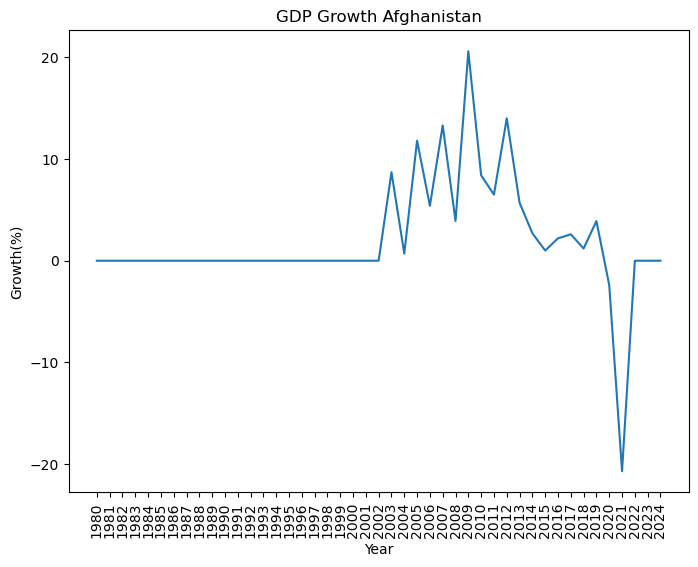

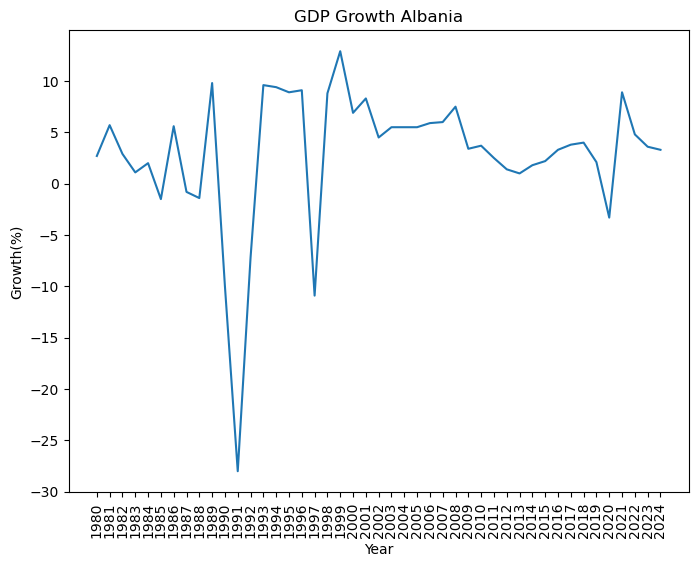

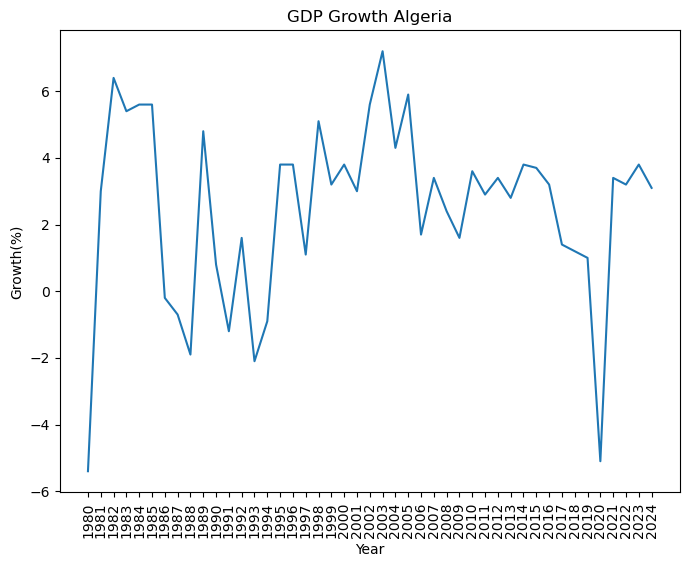

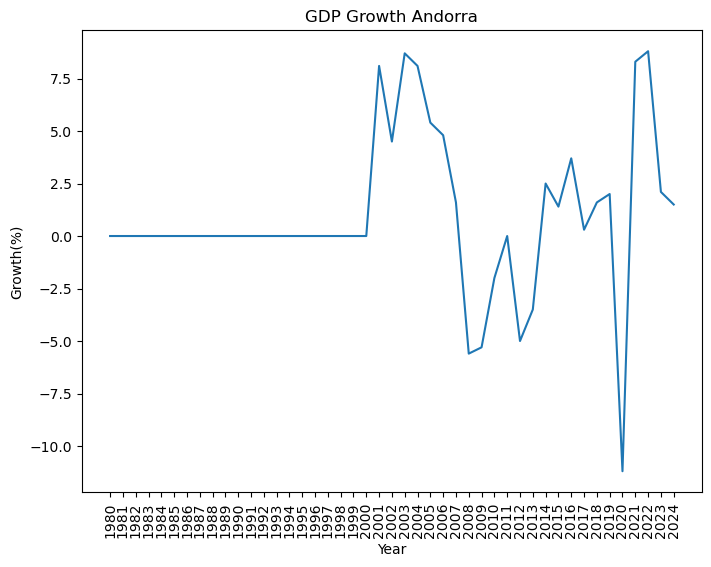

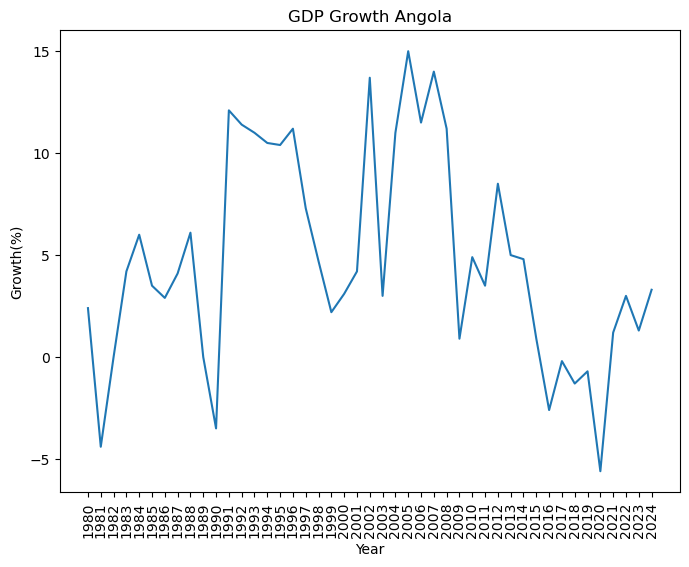

...

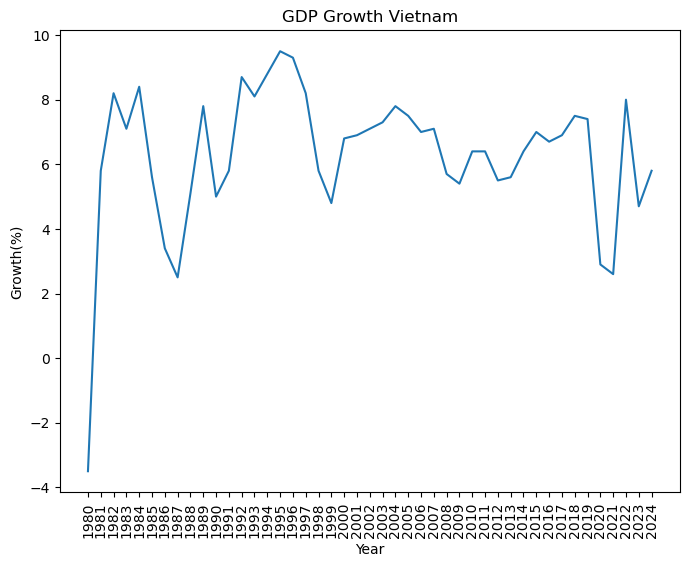

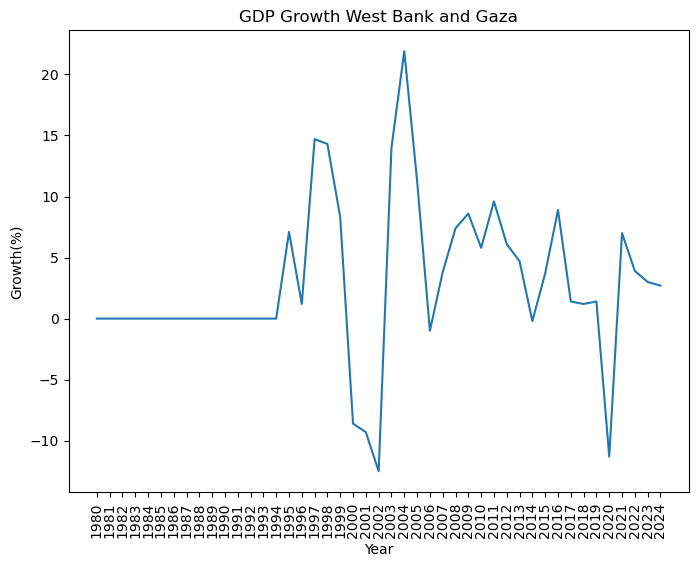

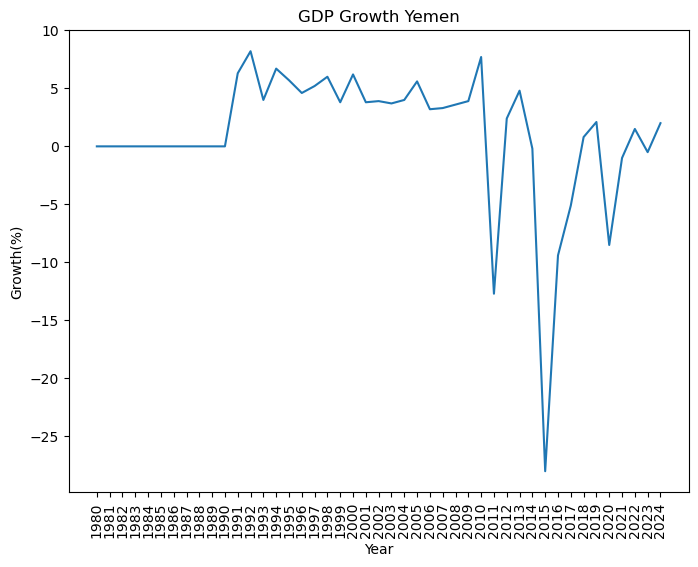

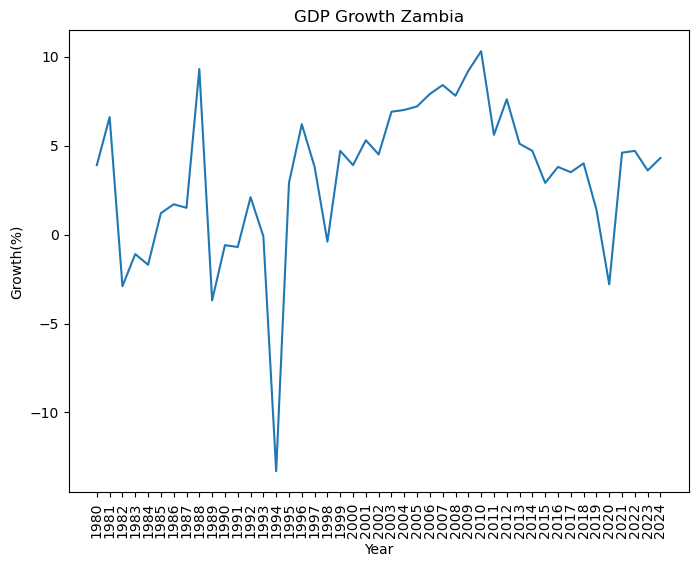

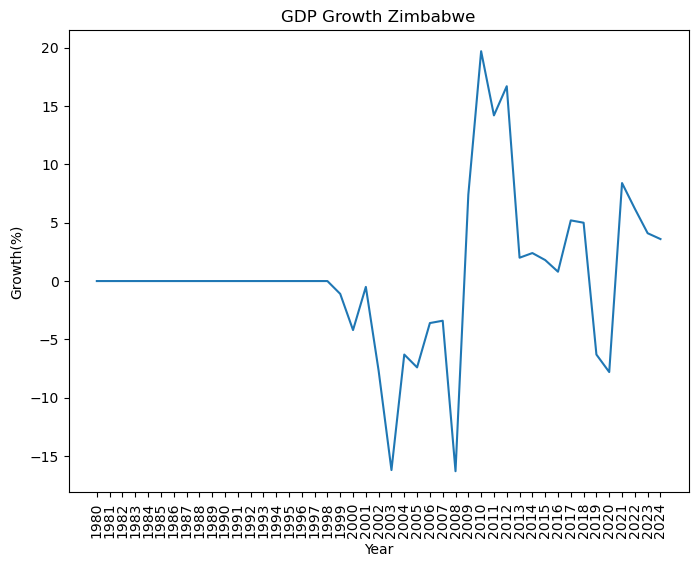

In [15]:
#Plotting the trend of the gdp of each country 
for index, row in gdp_growth.iterrows():
    country_name = row['country']
    gdp_data = row.values[1:]

    plt.figure(figsize=(8, 6))
    plt.plot(gdp_growth.columns[1:], gdp_data)
    plt.title(f'GDP Growth {country_name}')
    plt.xlabel('Year')
    plt.ylabel('Growth(%)')
    plt.xticks(rotation='vertical')
    plt.show()

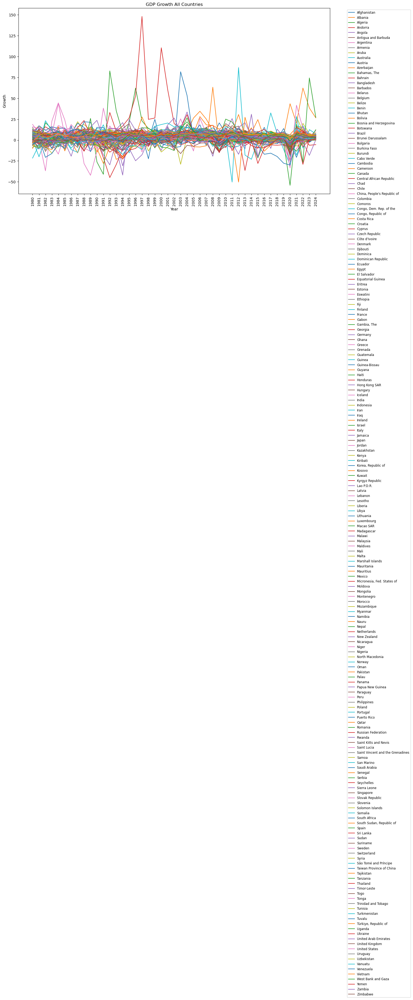

In [16]:
#Plotting hte trend of the gdp of all the countries
plt.figure(figsize=(15, 9)) 

for index, row in gdp_growth.iterrows():
    country_name = row['country']
    gdp_data = row.values[1:]

    plt.plot(gdp_growth.columns[1:], gdp_data, label=country_name)

plt.title('GDP Growth All Countries')
plt.xlabel('Year')
plt.ylabel('Growth')
plt.xticks(rotation='vertical')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout()
plt.show()

In [17]:
#Printing the dataset 
gdp_growth

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.2,2.6,1.2,3.9,-2.4,-20.7,0.0,0.0,0.0
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,2.2,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.7,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1
3,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.4,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3
5,Antigua and Barbuda,8.2,3.8,-0.1,5.4,10.2,7.6,11.5,6.6,5.2,...,3.8,5.5,3.1,6.8,4.3,-17.5,6.6,8.5,5.6,5.4
6,Argentina,0.7,-5.7,-3.1,3.7,2.0,-7.0,7.1,2.5,-2.0,...,2.7,-2.1,2.8,-2.6,-2.0,-9.9,10.7,5.0,-2.5,2.8
7,Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.3,0.2,7.5,5.2,7.6,-7.2,5.7,12.6,7.0,5.0
8,Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.1,18.6,...,3.6,2.1,0.7,2.4,-2.3,-24.0,27.6,10.5,2.3,1.2
9,Australia,2.9,4.1,0.1,-0.5,6.3,5.5,2.4,4.9,4.3,...,2.3,2.7,2.4,2.8,1.9,-1.8,5.2,3.7,1.8,1.2


In [18]:
# Extracting the dataset to excel file 
gdp_growth.to_excel('gdp_growth_clean.xlsx', index=False)

In [19]:
# Creating a new column with the mean of each country 
avg_growth = gdp_growth.iloc[:, 1:].mean(axis=1) 
gdp_growth['avg_growth'] = avg_growth
gdp_growth.round(1)

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2016,2017,2018,2019,2020,2021,2022,2023,2024,avg_growth
0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.2,2.6,1.2,3.9,-2.4,-20.7,0.0,0.0,0.0,2.0
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3,2.9
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1,2.5
3,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5,0.9
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3,4.8
5,Antigua and Barbuda,8.2,3.8,-0.1,5.4,10.2,7.6,11.5,6.6,5.2,...,5.5,3.1,6.8,4.3,-17.5,6.6,8.5,5.6,5.4,3.5
6,Argentina,0.7,-5.7,-3.1,3.7,2.0,-7.0,7.1,2.5,-2.0,...,-2.1,2.8,-2.6,-2.0,-9.9,10.7,5.0,-2.5,2.8,1.8
7,Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.2,7.5,5.2,7.6,-7.2,5.7,12.6,7.0,5.0,3.9
8,Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.1,18.6,...,2.1,0.7,2.4,-2.3,-24.0,27.6,10.5,2.3,1.2,3.1
9,Australia,2.9,4.1,0.1,-0.5,6.3,5.5,2.4,4.9,4.3,...,2.7,2.4,2.8,1.9,-1.8,5.2,3.7,1.8,1.2,3.0


In [20]:
# Putting the values in decimals rounds
gdp_growth = gdp_growth.round(1)
gdp_growth

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2016,2017,2018,2019,2020,2021,2022,2023,2024,avg_growth
0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.2,2.6,1.2,3.9,-2.4,-20.7,0.0,0.0,0.0,2.0
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3,2.9
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1,2.5
3,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5,0.9
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3,4.8
5,Antigua and Barbuda,8.2,3.8,-0.1,5.4,10.2,7.6,11.5,6.6,5.2,...,5.5,3.1,6.8,4.3,-17.5,6.6,8.5,5.6,5.4,3.5
6,Argentina,0.7,-5.7,-3.1,3.7,2.0,-7.0,7.1,2.5,-2.0,...,-2.1,2.8,-2.6,-2.0,-9.9,10.7,5.0,-2.5,2.8,1.8
7,Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.2,7.5,5.2,7.6,-7.2,5.7,12.6,7.0,5.0,3.9
8,Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.1,18.6,...,2.1,0.7,2.4,-2.3,-24.0,27.6,10.5,2.3,1.2,3.1
9,Australia,2.9,4.1,0.1,-0.5,6.3,5.5,2.4,4.9,4.3,...,2.7,2.4,2.8,1.9,-1.8,5.2,3.7,1.8,1.2,3.0


In [21]:
#Defining the X and the y axis
columns_to_drop = ['country','avg_growth']
X = gdp_growth.drop(columns=columns_to_drop)
y = gdp_growth['avg_growth']

In [22]:
# Spliting the X and y in train and test 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [23]:
# Testing the model LR 
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
predictions_lr = model_lr.predict(X_test)

In [24]:
# Printing the predictions 
predictions_lr

array([ 2.15221688,  0.15791092,  2.24452904,  1.68886335,  1.94206625,
        1.80683528,  4.12610672,  2.43305529,  4.85418947,  1.93785881,
        2.50602032,  0.90995468, -0.8212983 ,  1.69969815,  4.63148238,
        0.04999587,  3.70283615,  2.99634301,  3.34166407,  2.23481569,
        2.27650178,  1.87966342,  2.60116346,  3.06321974,  1.70806499,
        3.35721999,  1.4270112 ,  4.6583155 ,  5.47855359,  2.98153249,
        4.17844209,  4.03322935, -1.06170544,  2.33290763,  3.85531581,
        2.06799141,  3.74671063,  4.0979272 ,  4.34521381,  2.87745777,
        3.5166244 ,  4.46578323,  3.20399944,  3.05647446,  2.9026267 ,
        2.04891387,  0.89923294,  2.00727272,  4.03220575,  2.16166571,
        1.71304583,  0.99952998,  3.31901233,  5.29121991,  4.95771173,
        2.55902973,  5.05345109,  0.2954762 ,  5.39368588])

In [25]:
# Testing the model RF 
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
predictions_rf = model_rf.predict(X_test)

In [26]:
# Printing the predictions 
predictions_rf

array([1.846, 1.215, 2.65 , 2.348, 3.016, 2.12 , 3.568, 2.385, 3.298,
       2.768, 2.732, 1.711, 1.453, 1.74 , 3.91 , 2.397, 3.81 , 2.522,
       3.365, 2.834, 2.781, 2.956, 3.589, 3.684, 1.842, 3.116, 2.279,
       4.202, 4.199, 2.799, 3.748, 3.425, 1.602, 2.169, 3.752, 2.051,
       2.906, 3.663, 3.583, 2.808, 3.797, 4.007, 3.345, 3.05 , 2.473,
       2.008, 2.907, 2.514, 3.245, 2.038, 2.221, 1.715, 3.243, 4.679,
       4.457, 2.577, 4.629, 1.798, 4.79 ])

In [27]:
# Testing the model GB 
model_gb = GradientBoostingRegressor()
model_gb.fit(X_train, y_train)
predictions_gb = model_gb.predict(X_test)

In [28]:
# Printing the predictions 
predictions_gb

array([1.92269309, 0.84265027, 3.33736389, 1.93749971, 2.12764063,
       2.15349333, 4.12937255, 2.0286864 , 3.7854856 , 2.67556176,
       2.66763072, 1.30992359, 0.83999242, 1.65600414, 4.44683864,
       1.91056579, 3.89962882, 2.36911474, 2.94254214, 2.25047653,
       3.20746443, 2.52082904, 3.86274662, 3.58616513, 1.56849596,
       3.38360901, 2.24250501, 4.28190056, 4.40972686, 3.04773045,
       4.05241008, 3.69123825, 1.03319385, 2.51854093, 3.54239187,
       1.71107376, 2.79830801, 3.68334518, 3.62598033, 3.10130649,
       4.31474301, 3.86679282, 3.12209695, 2.58776983, 2.22737984,
       1.89300823, 2.25985876, 3.2398616 , 3.07131953, 1.7649838 ,
       1.18010266, 1.34316431, 3.37996612, 5.049095  , 4.35108182,
       2.81444547, 6.41902108, 0.9758049 , 4.98837487])

In [29]:
# Evaluating the model LR
mae_lr = mean_absolute_error(y_test, predictions_lr)
mse_lr = mean_squared_error(y_test, predictions_lr)
r2_lr = r2_score(y_test, predictions_lr)

In [30]:
# Evaluating the model RF
mae_rf = mean_absolute_error(y_test, predictions_rf)
mse_rf = mean_squared_error(y_test, predictions_rf)
r2_rf = r2_score(y_test, predictions_rf)

In [31]:
# Evaluating the model GB
mae_gb = mean_absolute_error(y_test, predictions_gb)
mse_gb = mean_squared_error(y_test, predictions_gb)
r2_gb = r2_score(y_test, predictions_gb)

In [32]:
# Printing the evaluations of the models
rmse_lr = np.sqrt(mean_squared_error(y_test, predictions_lr))
rmse_rf = np.sqrt(mean_squared_error(y_test, predictions_rf))
rmse_gb = np.sqrt(mean_squared_error(y_test, predictions_gb))

print("Linear Regression Metrics:")
print("Mean Absolute Error:", mae_lr)
print("Mean Squared Error:", mse_lr)
print("Root Mean Squared Error:", rmse_lr)
print("R-squared:", r2_lr)

print("\nRandom Forest Metrics:")
print("Mean Absolute Error:", mae_rf)
print("Mean Squared Error:", mse_rf)
print("Root Mean Squared Error:", rmse_rf)
print("R-squared:", r2_rf)

print("\nGradient Boosting Metrics:")
print("Mean Absolute Error:", mae_gb)
print("Mean Squared Error:", mse_gb)
print("Root Mean Squared Error:", rmse_gb)
print("R-squared:", r2_gb)

Linear Regression Metrics:
Mean Absolute Error: 0.028525296326923386
Mean Squared Error: 0.0012134733503008682
Root Mean Squared Error: 0.03483494438492572
R-squared: 0.9994508920539322

Random Forest Metrics:
Mean Absolute Error: 0.6168983050847459
Mean Squared Error: 0.7233825932203392
Root Mean Squared Error: 0.850519014026341
R-squared: 0.6726626671398449

Gradient Boosting Metrics:
Mean Absolute Error: 0.5646528007125107
Mean Squared Error: 0.534659271324883
Root Mean Squared Error: 0.7312039874924664
R-squared: 0.7580617207205417


In [33]:
#Defining the X and y axis 
columns_to_drop = ['country','avg_growth']
X = gdp_growth.drop(columns=columns_to_drop)
y = gdp_growth['avg_growth']

In [34]:
# Applying the LR model
LR= LinearRegression()
LR.fit(X, y)
predictions_2025 = LR.predict(X)

In [35]:
# Printing the predictions of 2025
predictions_2025

array([ 1.9931063 ,  2.89213803,  2.48840679,  0.91332396,  4.79055612,
        3.51094766,  1.80876038,  3.87175594,  3.08872941,  2.98647097,
        1.81047064,  3.32378048,  1.99561874,  3.8944877 ,  5.09650737,
        0.89815296,  2.25450319,  1.8614035 ,  4.83498945,  4.08721069,
        6.6728203 ,  2.7985459 ,  4.6182828 ,  5.47843732,  2.31620422,
        0.90030496,  1.33422877,  4.90751219,  2.14521985,  5.04104517,
        5.47941183,  3.37300528,  2.27386984,  1.38860991,  4.41263686,
        4.02301914,  8.89792798,  3.42024433,  2.73399612,  1.87354287,
        3.29936635,  3.72527242,  1.71495958,  3.9634433 ,  1.49006088,
        3.04047231,  1.8065435 ,  2.07307972,  2.64358041,  4.60314859,
        2.63049343,  4.53229004,  1.68160633, 13.60988583,  2.28489265,
        2.43356247,  3.73429372,  5.86994575,  2.32636778,  2.02081235,
        1.69966698,  2.06251896,  3.30972699,  1.2662843 ,  1.55078993,
        4.44435939,  0.99860065,  3.33173275,  2.97335621,  4.11

In [36]:
# Converting the results from exponencial numbers to normal numbers 
pred_2025 = np.round(predictions_2025, decimals=1)
gdp_growth['2025'] = pred_2025

In [38]:
# Printing the dataset
gdp_growth

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2017,2018,2019,2020,2021,2022,2023,2024,avg_growth,2025
0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.6,1.2,3.9,-2.4,-20.7,0.0,0.0,0.0,2.0,2.0
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3,2.9,2.9
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1,2.5,2.5
3,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5,0.9,0.9
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3,4.8,4.8
5,Antigua and Barbuda,8.2,3.8,-0.1,5.4,10.2,7.6,11.5,6.6,5.2,...,3.1,6.8,4.3,-17.5,6.6,8.5,5.6,5.4,3.5,3.5
6,Argentina,0.7,-5.7,-3.1,3.7,2.0,-7.0,7.1,2.5,-2.0,...,2.8,-2.6,-2.0,-9.9,10.7,5.0,-2.5,2.8,1.8,1.8
7,Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.5,5.2,7.6,-7.2,5.7,12.6,7.0,5.0,3.9,3.9
8,Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.1,18.6,...,0.7,2.4,-2.3,-24.0,27.6,10.5,2.3,1.2,3.1,3.1
9,Australia,2.9,4.1,0.1,-0.5,6.3,5.5,2.4,4.9,4.3,...,2.4,2.8,1.9,-1.8,5.2,3.7,1.8,1.2,3.0,3.0


In [39]:
#Dropping the column 'avg growth'
gdp_growth.drop(columns=['avg_growth'], inplace=True)
gdp_growth

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.2,2.6,1.2,3.9,-2.4,-20.7,0.0,0.0,0.0,2.0
1,Albania,2.7,5.7,2.9,1.1,2.0,-1.5,5.6,-0.8,-1.4,...,3.3,3.8,4.0,2.1,-3.3,8.9,4.8,3.6,3.3,2.9
2,Algeria,-5.4,3.0,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.2,1.4,1.2,1.0,-5.1,3.4,3.2,3.8,3.1,2.5
3,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.7,0.3,1.6,2.0,-11.2,8.3,8.8,2.1,1.5,0.9
4,Angola,2.4,-4.4,0.0,4.2,6.0,3.5,2.9,4.1,6.1,...,-2.6,-0.2,-1.3,-0.7,-5.6,1.2,3.0,1.3,3.3,4.8
5,Antigua and Barbuda,8.2,3.8,-0.1,5.4,10.2,7.6,11.5,6.6,5.2,...,5.5,3.1,6.8,4.3,-17.5,6.6,8.5,5.6,5.4,3.5
6,Argentina,0.7,-5.7,-3.1,3.7,2.0,-7.0,7.1,2.5,-2.0,...,-2.1,2.8,-2.6,-2.0,-9.9,10.7,5.0,-2.5,2.8,1.8
7,Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.2,7.5,5.2,7.6,-7.2,5.7,12.6,7.0,5.0,3.9
8,Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.1,18.6,...,2.1,0.7,2.4,-2.3,-24.0,27.6,10.5,2.3,1.2,3.1
9,Australia,2.9,4.1,0.1,-0.5,6.3,5.5,2.4,4.9,4.3,...,2.7,2.4,2.8,1.9,-1.8,5.2,3.7,1.8,1.2,3.0


In [40]:
# Extracting the dataset to excel file 
gdp_growth.to_excel('gdp_growth_pred_24_25.xlsx', index=False)

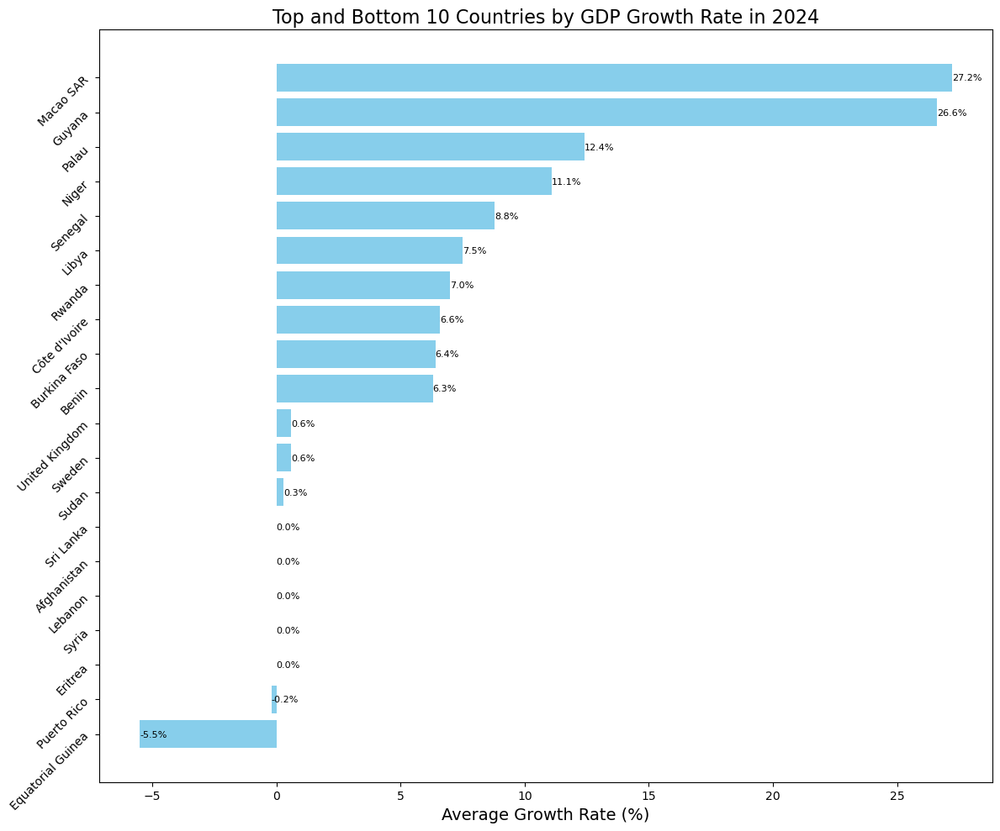

In [41]:
#Plotting the top 10 and bottoms of 2024 

gdp_growth.sort_values(by="2024", ascending=False, inplace=True)
top_bottom_10 = pd.concat([gdp_growth.head(10), gdp_growth.tail(10)])
plt.figure(figsize=(12, 10))
bars = plt.barh(top_bottom_10['country'], top_bottom_10['2024'], color='skyblue')


plt.xlabel('Average Growth Rate (%)', fontsize=14)
plt.title('Top and Bottom 10 Countries by GDP Growth Rate in 2024', fontsize=16)
plt.gca().invert_yaxis()  


plt.yticks(fontsize=10, rotation=45)


for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, '{:.1f}%'.format(width), ha='left', va='center', fontsize=8)

plt.tight_layout() 
plt.savefig('GDP_Growth_Rate_2024.png')
plt.show()

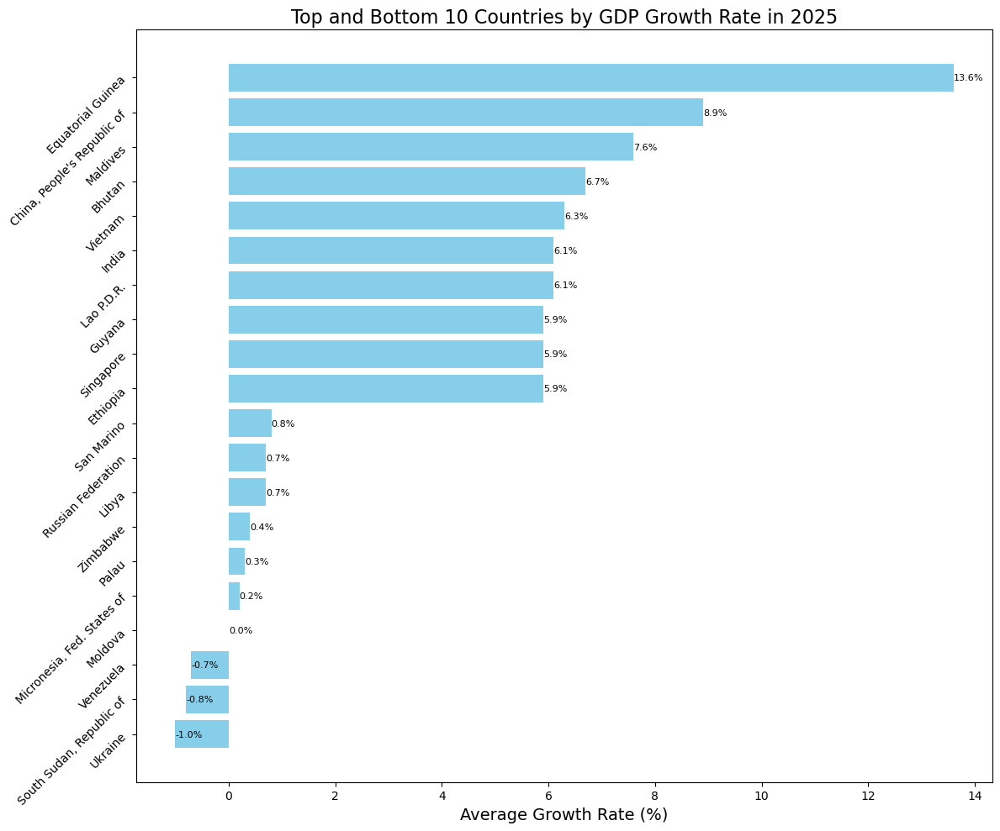

In [42]:
#Plotting the top 10 and bottoms of 2025
gdp_growth.sort_values(by="2025", ascending=False, inplace=True)
top_bottom_10 = pd.concat([gdp_growth.head(10), gdp_growth.tail(10)])
plt.figure(figsize=(12, 10))
bars = plt.barh(top_bottom_10['country'], top_bottom_10['2025'], color='skyblue')


plt.xlabel('Average Growth Rate (%)', fontsize=14)
plt.title('Top and Bottom 10 Countries by GDP Growth Rate in 2025', fontsize=16)
plt.gca().invert_yaxis()  


plt.yticks(fontsize=10, rotation=45)


for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, '{:.1f}%'.format(width), ha='left', va='center', fontsize=8)

plt.tight_layout()
plt.savefig('GDP_Growth_Rate_2025.png')
plt.show()

In [43]:
# Crewating a new column with the years and sorting the values by country
gdp_growth_pivot = pd.melt(gdp_growth, id_vars=['country'], var_name='year', value_name='gdp_growth')
gdp_growth_pivot = gdp_growth_pivot.sort_values(by='country')
gdp_growth_pivot

,country,year,gdp_growth
1514,Afghanistan,1987,0.0
2298,Afghanistan,1991,0.0
8374,Afghanistan,2022,0.0
1122,Afghanistan,1985,0.0
6806,Afghanistan,2014,2.7
8570,Afghanistan,2023,0.0
7786,Afghanistan,2019,3.9
8766,Afghanistan,2024,0.0
4258,Afghanistan,2001,0.0
4846,Afghanistan,2004,0.7


In [44]:
# Sorting the values by country and year
gdp_growth_pivot = gdp_growth_pivot.sort_values(by=['country','year'])
gdp_growth_pivot

,country,year,gdp_growth
142,Afghanistan,1980,0.0
338,Afghanistan,1981,0.0
534,Afghanistan,1982,0.0
730,Afghanistan,1983,0.0
926,Afghanistan,1984,0.0
1122,Afghanistan,1985,0.0
1318,Afghanistan,1986,0.0
1514,Afghanistan,1987,0.0
1710,Afghanistan,1988,0.0
1906,Afghanistan,1989,0.0


In [45]:
# Extracting the dataset to an excel file 
gdp_growth_pivot.to_excel('gdp_growth_pivot.xlsx', index=False)